# EDA (Exploratory Data Analysis)

In [1]:
from pathlib import Path

class AgriVisionDataset:
    def __init__(self, base_path: str | Path):
        self.base_dir = Path(base_path)
        self.modos_validos = {"train", "val", "test"}

    def carregar(self, mode: str) -> dict:
        if mode not in self.modos_validos:
            raise ValueError(f"Modo inválido. Escolha entre: {self.modos_validos}")

        raiz_modo = self.base_dir / mode
        labels_dirs = []

        if mode != "test":
            labels_dir = raiz_modo / "labels"
            labels_dirs = [d for d in labels_dir.iterdir() if d.is_dir()]

        # Retorna o pacote padronizado (para o 'test', labels_dirs será uma lista vazia [])
        return {
            "base": raiz_modo,
            "rgb": raiz_modo / "images/rgb",
            "nir": raiz_modo / "images/nir",
            "masks": raiz_modo / "masks",  # Máscara de área válida (costuma existir no teste)
            "boundaries": raiz_modo / "boundaries",
            "labels_dirs": labels_dirs,  # Vazio se for 'test'
        }

dataset = AgriVisionDataset('/home/visionary/Brendon/LeticiaRittner/projeto/Agriculture-Vision-2021/supervised/Agriculture-Vision-2021')
train_paths_dict = dataset.carregar('train')
val_paths_dict = dataset.carregar('val')
test_paths_dict = dataset.carregar('test')

In [2]:
import random
random.seed(42)

## Plot de algumas amostras do dataset

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def calcular_ndvi(rgb_path, nir_path):
    rgb = mpimg.imread(rgb_path)
    nir = mpimg.imread(nir_path)

    # Converte para float para cálculos precisos e evitar overflow
    red = rgb[:, :, 0].astype(float)
        
    # Fórmula da imagem: (NIR - RED) / (NIR + RED)
    denominador = nir + red
    numerador = nir - red
    ndvi = ndvi = np.divide(numerador, denominador, out=np.zeros_like(denominador), where=(denominador != 0))

    return ndvi

def fusao_labels(name_arquivo, labels_dirs_atuais):
    mascara_final = None
    classes_encontradas = []

    for label_dir in labels_dirs_atuais:
        caminho_img = label_dir / name_arquivo
        mascara_atual = mpimg.imread(caminho_img)

        if np.any(mascara_atual > 0):
            classes_encontradas.append(label_dir.name)

        if mascara_final is None:
            mascara_final = mascara_atual
        else:
            mascara_final = np.maximum(mascara_final, mascara_atual)

    if not classes_encontradas:
        classes_encontradas = ["Background"]

    return mascara_final, classes_encontradas

In [4]:
from PIL import Image

def visualizar_amostras(paths_dict: dict, num_amostras=3):
    mode_name = paths_dict["base"].name.upper()
    isTest = mode_name == "TEST"

    num_colunas = 5 if isTest else 6

    arquivos_rgb = [
        arquivo.name for arquivo in paths_dict["rgb"].iterdir() if arquivo.is_file()
    ]
    amostras = random.sample(arquivos_rgb, num_amostras)

    for img in amostras:
        id = img.split(".")[0]

        rgb_path = paths_dict["rgb"] / img
        nir_path = paths_dict["nir"] / img
        mask_path = paths_dict["masks"] / f"{id}.png"
        boundary_path = paths_dict["boundaries"] / f"{id}.png"
        img_rgb = np.array(Image.open(rgb_path))
        img_nir = np.array(Image.open(nir_path))
        img_mask = np.array(Image.open(mask_path))  
        img_boundary = np.array(Image.open(boundary_path)) 

        img_labels, lista_classes = fusao_labels(f"{id}.png", labels_dirs_atuais=paths_dict["labels_dirs"])
        ndvi_array = calcular_ndvi(rgb_path, nir_path)

        fig, axes = plt.subplots(2, num_colunas, figsize=(20, 9))
        fig.suptitle(
            f"Sample ID: {id} ({mode_name})",
            fontsize=16,
            fontweight="bold",
        )

        # Limpa eixos e coloca bordas pretas para todas as subplots
        for ax in axes.flat:
            ax.set(xticks=[], yticks=[])
            for spine in ax.spines.values():
                spine.set(edgecolor="black", linewidth=0.8)
                
        axes[1, 2].axis("off")
        axes[1, 3].axis("off")

        if not isTest:
            axes[1, 4].axis("off")

        axes[0, 0].imshow(img_rgb, vmin=0, vmax=255)
        axes[0, 0].set_title("RGB (Raw)")
        axes[0, 1].imshow(img_nir, cmap="gray", vmin=0, vmax=255)
        axes[0, 1].set_title("NIR (Raw)")
        axes[0, 2].imshow(img_mask, cmap="gray", vmin=0, vmax=255)
        axes[0, 2].set_title("Mask")
        axes[0, 3].imshow(img_boundary, cmap="gray", vmin=0, vmax=255)
        axes[0, 3].set_title("Boundary")

        col_ndvi = 4 if isTest else 5

        if not isTest:
            titulo_dinamico = ", ".join(lista_classes)
            axes[0, 4].imshow(img_labels, cmap="gray", vmin=0, vmax=1)
            axes[0, 4].set_title(titulo_dinamico, fontsize=10)

        img_ndvi = axes[0, col_ndvi].imshow(ndvi_array, cmap="RdYlGn", vmin=-1, vmax=1)
        axes[0, col_ndvi].set_title("NDVI (Raw)")

        # posX, posY, largura, altura (tudo em fração do tamanho da subplot)
        cax = axes[0, col_ndvi].inset_axes([1.05, 0.0, 0.05, 1.0])
        fig.colorbar(img_ndvi, cax=cax)


        if isTest:
            condicao_recorte = (img_mask > 0) & (img_boundary > 0)
        else:
            condicao_recorte = (img_labels > 0) & (img_mask > 0) & (img_boundary > 0)
        
        rgb_recortado = np.where(np.expand_dims(condicao_recorte, axis=-1), img_rgb, 0).astype(img_rgb.dtype)
        nir_recortado = np.where(condicao_recorte, img_nir, 0).astype(img_nir.dtype)
        ndvi_recortado = np.where(condicao_recorte, ndvi_array, np.nan)

        axes[1, 0].imshow(rgb_recortado, vmin=0, vmax=255)
        axes[1, 0].set_title("RGB (Region of Interest)")
        axes[1, 1].imshow(nir_recortado, cmap="gray", vmin=0, vmax=255)
        axes[1, 1].set_title("NIR (Region of Interest)")

        img_ndvi_recortado = axes[1, col_ndvi].imshow(ndvi_recortado, cmap="RdYlGn", vmin=-1, vmax=1)
        axes[1, col_ndvi].set_title("NDVI (Region of Interest)")

        # posX, posY, largura, altura (tudo em fração do tamanho da subplot)
        cax = axes[1, col_ndvi].inset_axes([1.05, 0.0, 0.05, 1.0])
        fig.colorbar(img_ndvi_recortado, cax=cax)

        plt.tight_layout()
        plt.show()

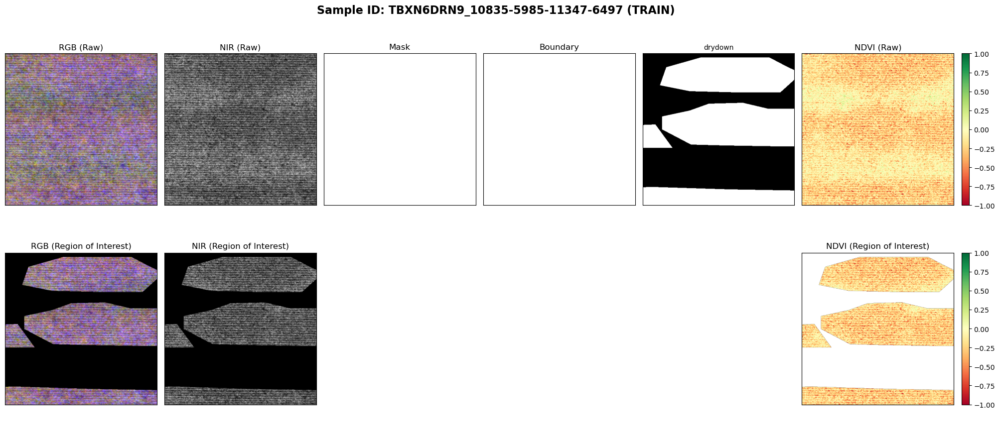

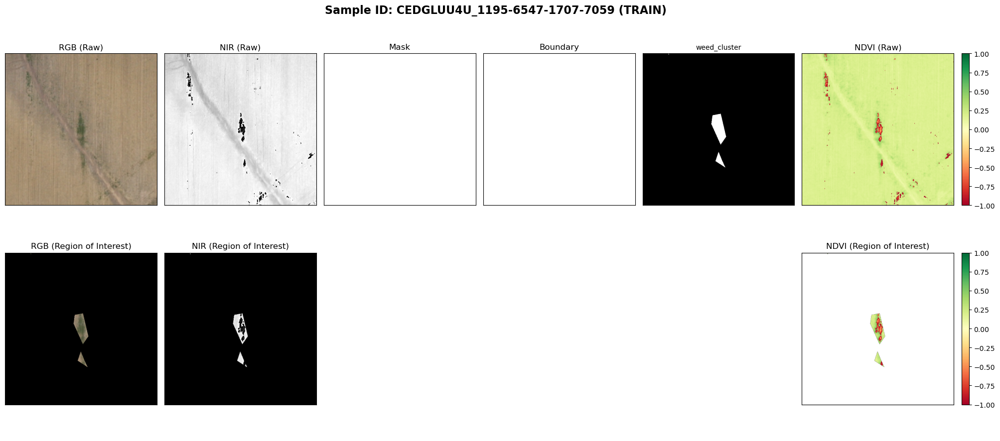

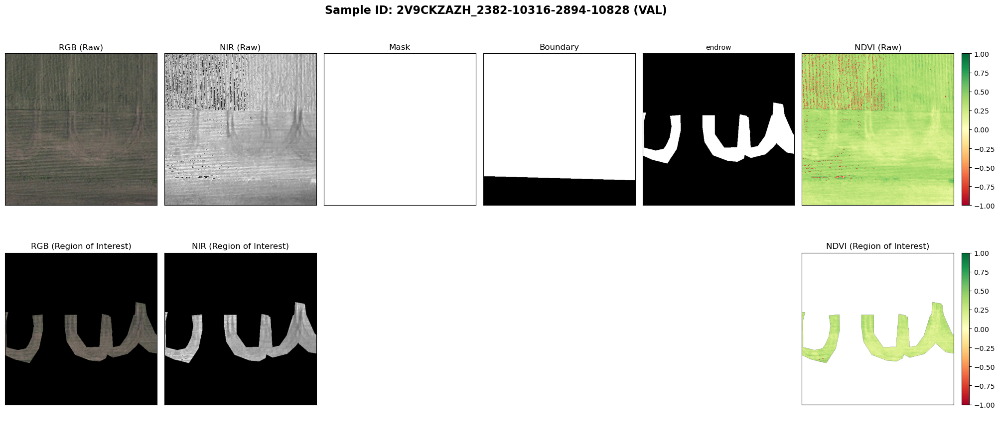

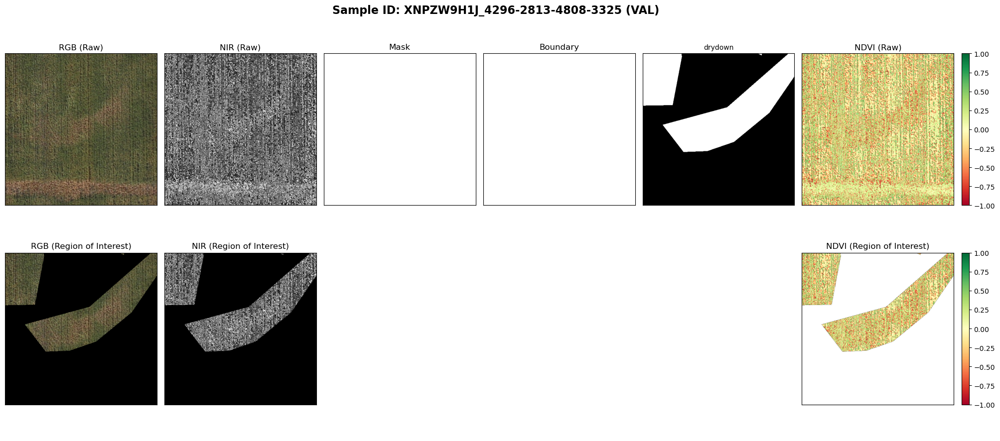

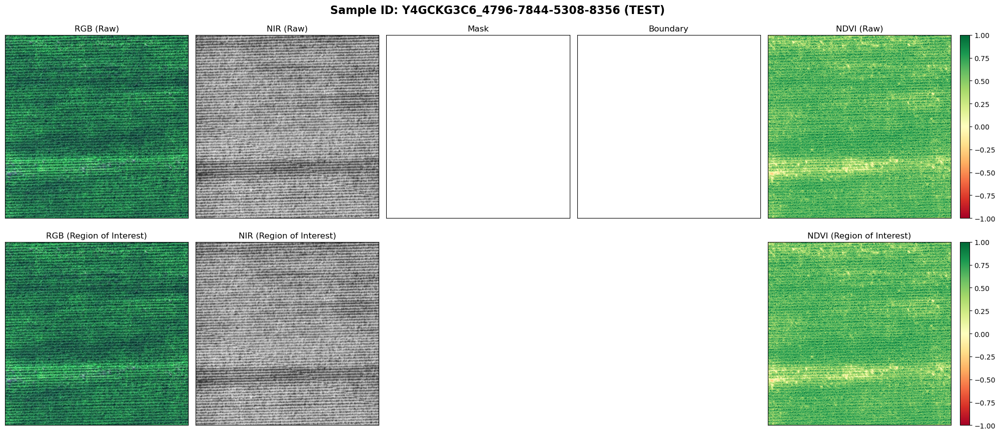

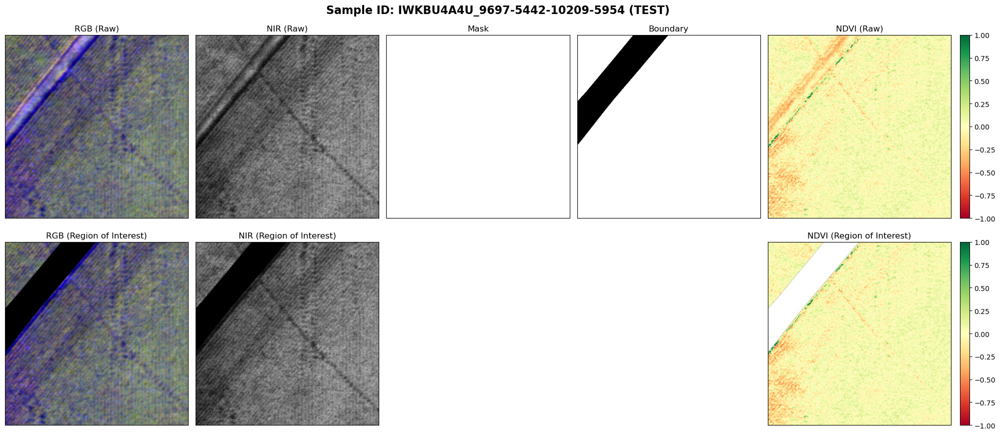

In [5]:
visualizar_amostras(train_paths_dict, num_amostras=2)
visualizar_amostras(val_paths_dict, num_amostras=2)
visualizar_amostras(test_paths_dict, num_amostras=2)

## Análises do dataset

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from concurrent.futures import ThreadPoolExecutor
from PIL import Image
from tqdm import tqdm

### Levantamento dos dados.

Nesta Seção está presente a forma que foram extraídas as informações do dataset. O resultado delas está salvo em ./artefatos/metricas_dataset.pkl; documento que é lido na Seção seguinte (por isso sugiro pular esta Seção).

Caso as métricas obtidas em ./artefatos/metricas_dataset.pkl não te atendam, faça as alterações necessárias para extrair as informações que você queira, e recomendo retomar a leitura desta Seção.

In [7]:
def extrair_dados_imagem(filename: str, labels_dirs: list) -> dict:
    instancias_imagem = {}
    filename_png = f"{filename.split('.')[0]}.png"

    for label_dir in labels_dirs:
        img_path = label_dir / filename_png
        if img_path.exists():
            mask = np.array(Image.open(img_path))
            qtd_pixels = np.sum(mask > 0)

            if qtd_pixels > 0:
                instancias_imagem[label_dir.name] = qtd_pixels

    return instancias_imagem


def extrair_metricas_dataset(paths_dict: dict):
    labels_dirs = paths_dict["labels_dirs"]
    nomes_classes = [d.name for d in labels_dirs]
    arquivos = [f.name for f in paths_dict["rgb"].iterdir() if f.is_file()]

    print(
        f"Executando varredura única em {len(arquivos)} imagens..."
    )

    dados_instancias = {}
    matriz_coocorrencia = np.zeros(
        (len(nomes_classes), len(nomes_classes)), dtype=int
    )
    class_to_idx = {nome: idx for idx, nome in enumerate(nomes_classes)}

    with ThreadPoolExecutor() as executor:
        resultados = list(
            tqdm(
                executor.map(
                    lambda f: extrair_dados_imagem(f, labels_dirs), arquivos
                ),
                total=len(arquivos)
            )
        )

        for instancias_imagem in resultados:
            classes_presentes = list(instancias_imagem.keys())

            # Alimenta a lista de instâncias com o tamanho de cada pixel ativo
            for classe, pixels in instancias_imagem.items():
                dados_instancias.setdefault(classe, []).append(pixels)

            # Atualiza a matriz de co-ocorrência cruzando as classes desta imagem
            for classe_a in classes_presentes:
                for classe_b in classes_presentes:
                    idx_a = class_to_idx[classe_a]
                    idx_b = class_to_idx[classe_b]
                    matriz_coocorrencia[idx_a, idx_b] += 1

    contagem_imagens = {
        classe: len(tamanhos) for classe, tamanhos in dados_instancias.items()
    }
    contagem_pixels = {
        classe: sum(tamanhos) for classe, tamanhos in dados_instancias.items()
    }

    registros_df = [
        {"Classe": classe, "Pixels": area}
        for classe, tamanhos in dados_instancias.items()
        for area in tamanhos
    ]
    df_escala = pd.DataFrame(registros_df)

    return (
        contagem_imagens,
        contagem_pixels,
        matriz_coocorrencia,
        df_escala,
        nomes_classes,
        len(arquivos)
    )

In [8]:
imgs_train, pixs_train, matriz_train, df_escala_train, classes_train, total_arquivos_train = extrair_metricas_dataset(train_paths_dict)
imgs_val, pixs_val, matriz_val, df_escala_val, classes_val, total_arquivos_val = extrair_metricas_dataset(val_paths_dict)

Executando varredura única em 56944 imagens...


  2%|▏         | 1384/56944 [00:04<02:49, 328.00it/s]

100%|██████████| 56944/56944 [03:23<00:00, 279.70it/s]


Executando varredura única em 18334 imagens...


100%|██████████| 18334/18334 [01:03<00:00, 290.44it/s]


Armazenamento das informações extraídas do dataset. Para isso, usou-se o .pkl, pois ele armazena os dados diretamente em bytes, sem ter que fazer conversões para conseguir armazenar dataframes e objetos.

In [14]:
import pickle
from pathlib import Path


def salvar_metricas_pickle(caminho_arquivo: str, dados_treino: tuple, dados_val: tuple) -> None:
    Path(caminho_arquivo).parent.mkdir(parents=True, exist_ok=True)
    payload = {"train": dados_treino, "val": dados_val}

    # 'wb': arquivo aberto em modo de escrita binária
    with open(caminho_arquivo, "wb") as f:
        # HIGHEST_PROTOCOL: protocolo disponível mais rápido p/ I/O 
        pickle.dump(payload, f, protocol=pickle.HIGHEST_PROTOCOL)

def carregar_metricas_pickle(caminho_arquivo: str) -> tuple:
    with open(caminho_arquivo, "rb") as f:
        payload = pickle.load(f)
    return payload["train"], payload["val"]

### Análises / Plots

In [15]:
pacote_train, pacote_val = carregar_metricas_pickle("artefatos/metricas_dataset.pkl")

(
    imgs_train,
    pixs_train,
    matriz_train,
    df_escala_train,
    classes_train,
    total_arquivos_train,
    titulo_train,
) = pacote_train

(
    imgs_val,
    pixs_val,
    matriz_val,
    df_escala_val,
    classes_val,
    total_arquivos_val,
    titulo_val,
) = pacote_val


In [11]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

def plotFrequenciaClasses(contagem_imagens: dict, total_imagens: int, titulo: str) -> None:
    # Aplica ordem alfabética conforme nome das classes
    nomes_img = sorted(contagem_imagens.keys())
    valores_img = [contagem_imagens[nome] for nome in nomes_img]

    plt.figure(figsize=(12, 6))

    ax = sns.barplot(x=valores_img, y=nomes_img, hue=nomes_img, palette="viridis", legend=False)

    plt.title(
        f"Frequência das Classes por Imagem - Agriculture Vision ({titulo})\n(% do total de {total_imagens} imagens)",
        fontsize=14,
        fontweight="bold",
        pad=15,
    )
    plt.xlabel("Número de Imagens onde a classe aparece", fontsize=11)
    plt.ylabel("Classes", fontsize=11)

    for i, v in enumerate(valores_img):
        pct = (v / total_imagens) * 100
        ax.text(
            v + (max(valores_img) * 0.01),
            i,
            f"{v} ({pct:.1f}%)",
            va="center",
            fontsize=10,
        )

    sns.despine()
    plt.tight_layout()
    plt.show()


def plotAreaPixelsLog(contagem_pixels: dict, titulo: str) -> None:
    # Aplica ordem alfabética conforme nome das classes
    nomes_pix = sorted(contagem_pixels.keys())
    valores_pix = [contagem_pixels[nome] for nome in nomes_pix]

    plt.figure(figsize=(12, 6))

    ax = sns.barplot(x=valores_pix, y=nomes_pix, hue=nomes_pix, palette="magma", legend=False)

    ax.set_xscale("log")

    plt.title(
        f"Área Total Ocupada por Classe - Agriculture Vision ({titulo})\n(Total de Pixels em Escala Logarítmica)",
        fontsize=14,
        fontweight="bold",
        pad=15,
    )
    plt.xlabel("Número de Pixels (Log)", fontsize=11)
    plt.ylabel("Classes", fontsize=11)

    for i, v in enumerate(valores_pix):
        if v > 0:
            ax.text(
                v * 1.15,
                i,
                f"{v:,}",
                va="center",
                fontsize=10,
            )

    sns.despine()
    plt.tight_layout()
    plt.show()


def plotMatrizCoocorrencia(matriz_coocorrencia: np.ndarray, nomes_classes: list, titulo: str) -> None:
    # Aplica ordem alfabética conforme nome das classes
    ordem_oficial_nomes = sorted(nomes_classes) 
    # Mapeia e fatia a matriz para garantir que linhas e colunas sigam a ordem alfabética
    mapa_indices = {nome: i for i, nome in enumerate(nomes_classes)}
    indices_ordenados = [mapa_indices[nome] for nome in ordem_oficial_nomes]

    matriz_plot = matriz_coocorrencia[indices_ordenados, :][
        :, indices_ordenados
    ]
    np.fill_diagonal(matriz_plot, 0)

    plt.figure(figsize=(11, 9))
    sns.heatmap(matriz_plot, annot=True, fmt="d", cmap="YlOrRd", xticklabels=ordem_oficial_nomes,
                yticklabels=ordem_oficial_nomes, cbar_kws={"label": "Número de co-ocorrências"},
    )
    plt.title(f"Matriz de Co-ocorrência - Agriculture Vision ({titulo})\n(Frequência em que duas classes aparecem na mesma imagem)",
        fontsize=14, fontweight="bold", pad=15)
    plt.xticks(rotation=45, ha="right", fontsize=11)
    plt.yticks(rotation=0, fontsize=11)
    plt.tight_layout()
    plt.show()


# COOCORRÊNCIA NORMALIZADA P(Coluna | Linha)
def plotCoocorrenciaNormalizada(matriz_coocorrencia: np.ndarray, contagem_imagens: dict, nomes_classes: list, titulo: str) -> None:
    # ORDEM ALFABÉTICA
    ordem_oficial_nomes = sorted(nomes_classes)
    # Reordena a matriz original para a ordem alfabética
    mapa_indices = {nome: i for i, nome in enumerate(nomes_classes)}
    indices_ordenados = [mapa_indices[nome] for nome in ordem_oficial_nomes]
    matriz_bruta_ordenada = matriz_coocorrencia[indices_ordenados, :][:, indices_ordenados]

    # Aplica a divisão de probabilidade condicional
    matriz_norm = np.zeros_like(matriz_bruta_ordenada, dtype=np.float64)
    for i, classe_linha in enumerate(ordem_oficial_nomes):
        total_linha = contagem_imagens.get(classe_linha, 0)
        if total_linha > 0:
            matriz_norm[i, :] = matriz_bruta_ordenada[i, :] / total_linha
        else:
            matriz_norm[i, :] = 0.0
    np.fill_diagonal(matriz_norm, 0.0)

    plt.figure(figsize=(11, 8))
    sns.heatmap(matriz_norm, annot=True, fmt=".1%", cmap="YlOrRd", xticklabels=ordem_oficial_nomes,
        yticklabels=ordem_oficial_nomes, vmin=0.0, vmax=1.0,
        cbar_kws={"label": "Probabilidade Condicional"},
    )
    plt.title(
        f"Co-ocorrência Normalizada P(Coluna | Linha) - Agriculture Vision ({titulo})\n(Probabilidade da Coluna aparecer dado que a Linha está presente)",
        fontsize=14,
        fontweight="bold",
        pad=15,
    )
    plt.ylabel("Dado que esta classe existe na imagem...", fontsize=11)
    plt.xlabel(
        "...qual a probabilidade desta também aparecer?", fontsize=11
    )
    plt.xticks(rotation=45, ha="right", fontsize=11)
    plt.yticks(rotation=0, fontsize=11)
    plt.tight_layout()
    plt.show()


# DISTRIBUIÇÃO DE ESCALA (BOXPLOT)
def plotDistribuicaoEscala(df_escala: pd.DataFrame, titulo: str) -> None:
    ordem_oficial_nomes = sorted(df_escala["Classe"].unique())

    fig, ax = plt.subplots(figsize=(14, 8))

    sns.boxplot(
        x="Pixels",
        y="Classe",
        data=df_escala,
        order=ordem_oficial_nomes,
        ax=ax,
        hue="Classe",
        palette="vlag",
        width=0.6,
        showfliers=False,
        legend=False,
    )

    sns.stripplot(
        x="Pixels",
        y="Classe",
        data=df_escala,
        order=ordem_oficial_nomes,
        ax=ax,
        color=".3",
        alpha=0.05,
        size=2,
    )

    ax.set_xscale("log")
    ax.set_title(
        f"Distribuição de Escala das Instâncias - Agriculture Vision ({titulo})\n(Tamanho físico em pixels mapeado em Escala Logarítmica)",
        fontsize=14,
        fontweight="bold",
        pad=15,
    )
    ax.set_xlabel("Tamanho da Instância em Pixels (Log)", fontsize=11)
    ax.set_ylabel("Classes", fontsize=11)
    ax.grid(axis="x", linestyle="--", alpha=0.7)

    area_total_imagem = 512 * 512
    ax.axvline(
        area_total_imagem,
        color="red",
        linestyle=":",
        label=f"Área Total da Imagem ({area_total_imagem:,} px)",
    )
    ax.legend(loc="lower right")

    sns.despine()
    plt.tight_layout()
    plt.show()

Análises / Plots do split de treinamento

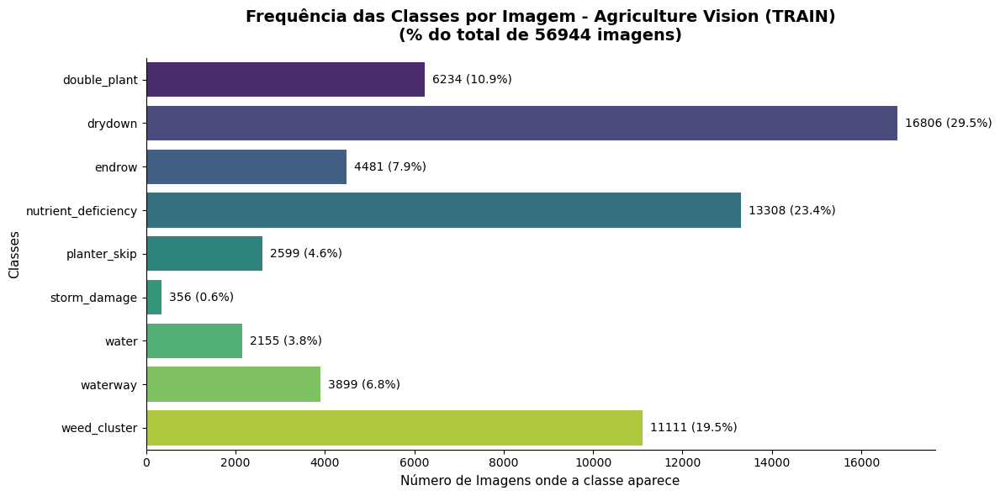

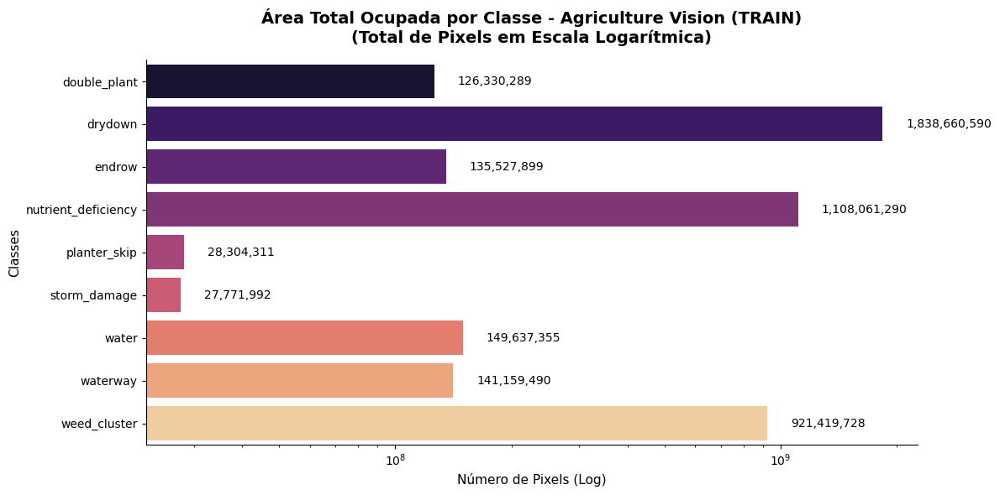

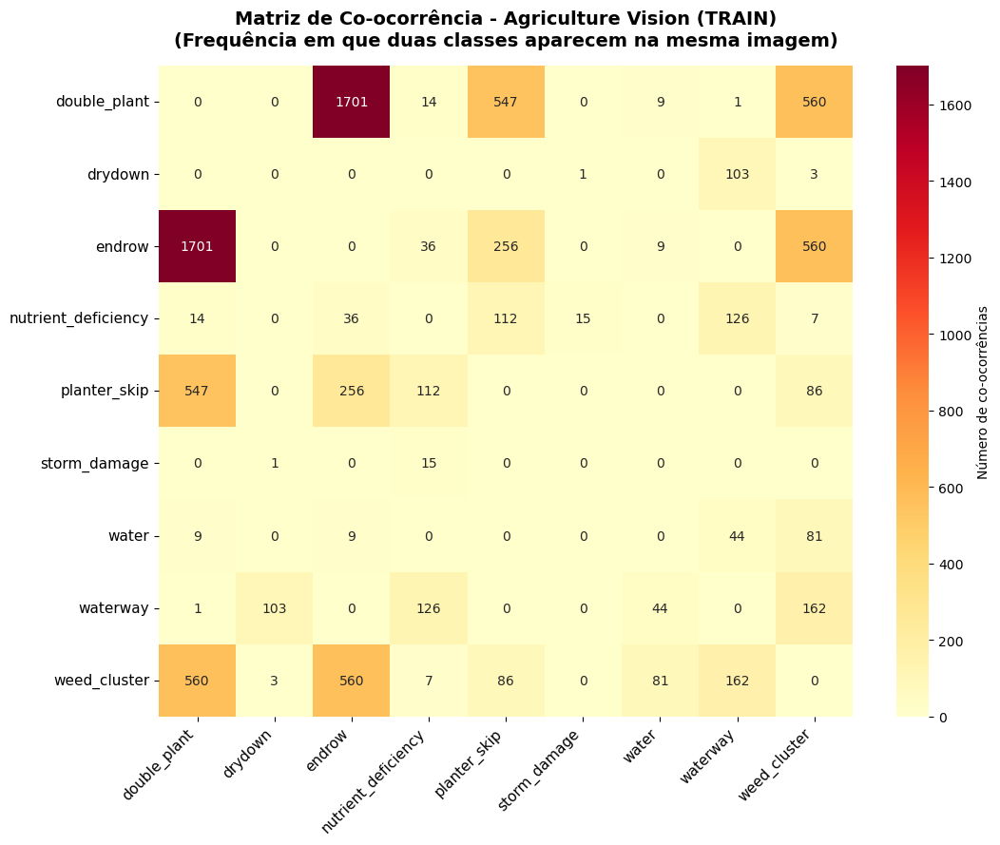

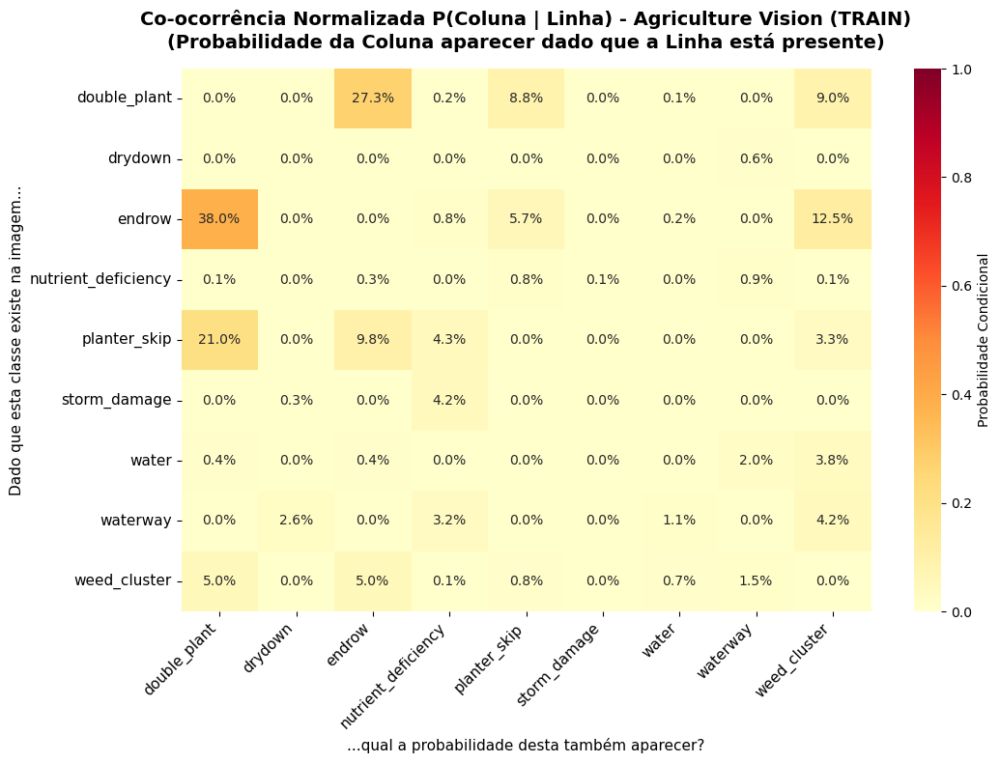

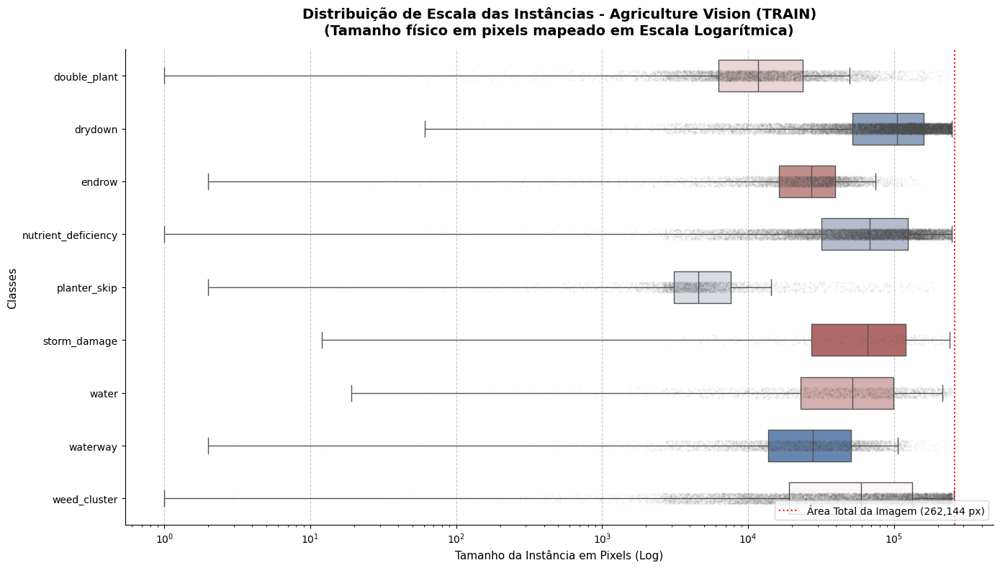

In [12]:
titulo_train = train_paths_dict["base"].name.upper()

plotFrequenciaClasses(imgs_train, total_arquivos_train, titulo_train)
plotAreaPixelsLog(pixs_train, titulo_train)
plotMatrizCoocorrencia(matriz_train, classes_train, titulo_train)
plotCoocorrenciaNormalizada(matriz_train, imgs_train, classes_train, titulo_train)
plotDistribuicaoEscala(df_escala_train, titulo_train)

Análises do split de validação

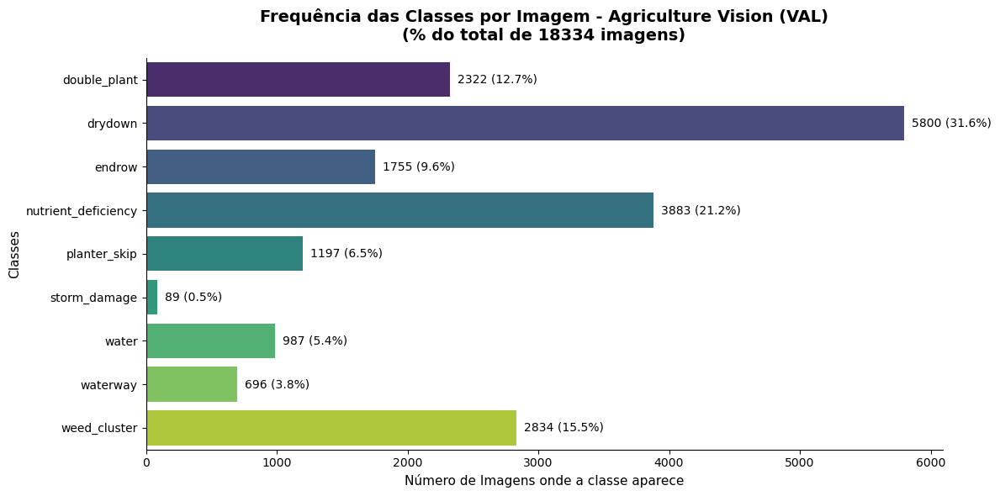

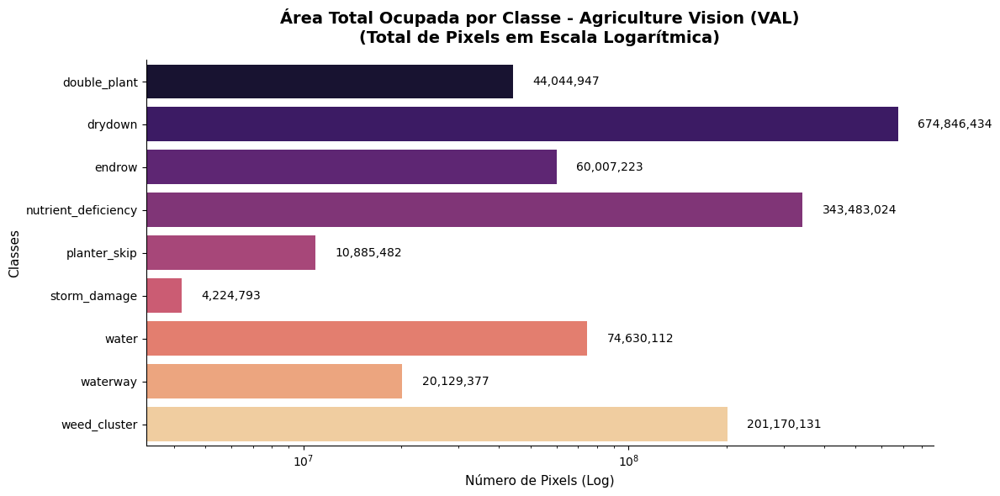

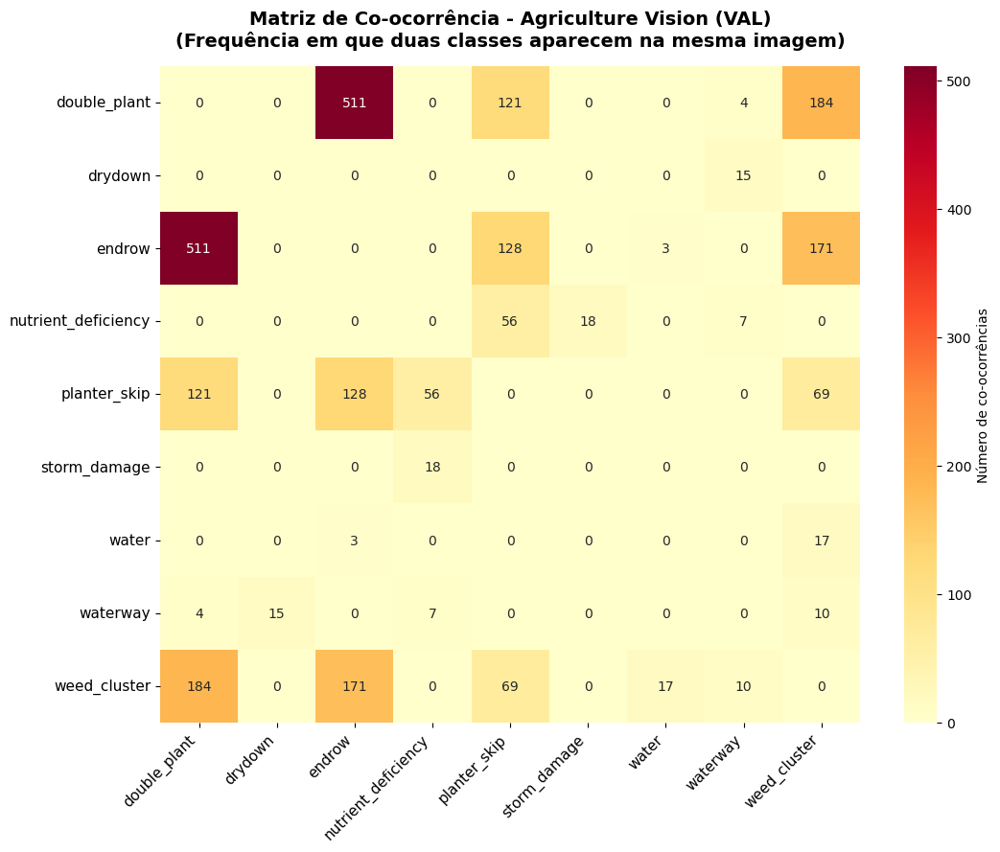

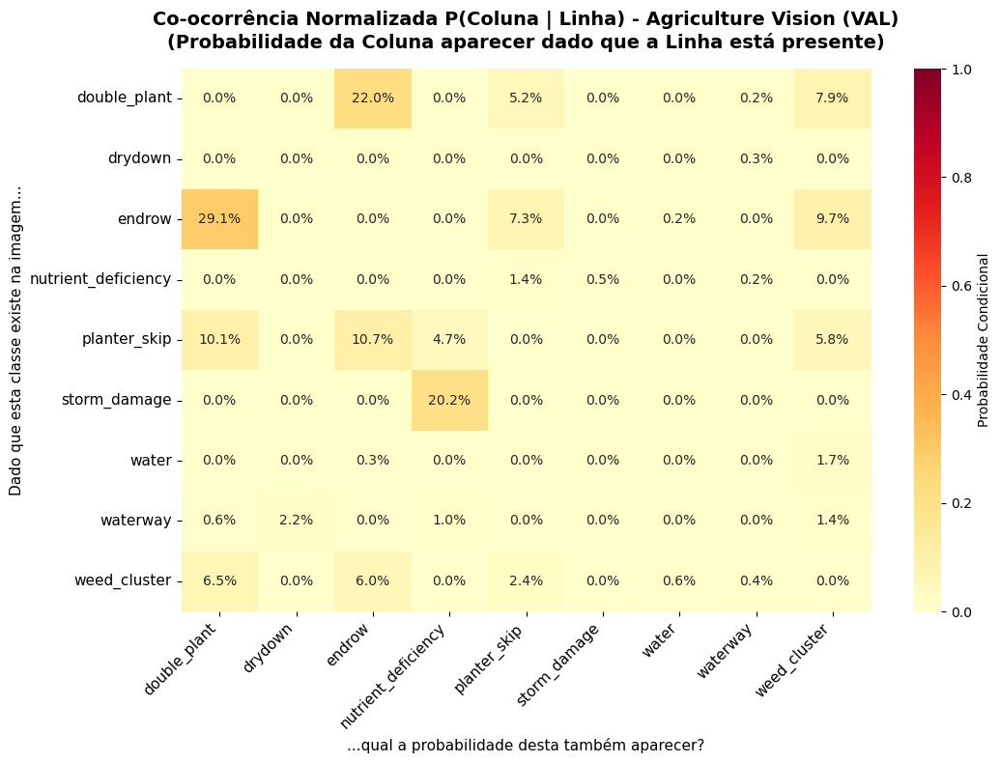

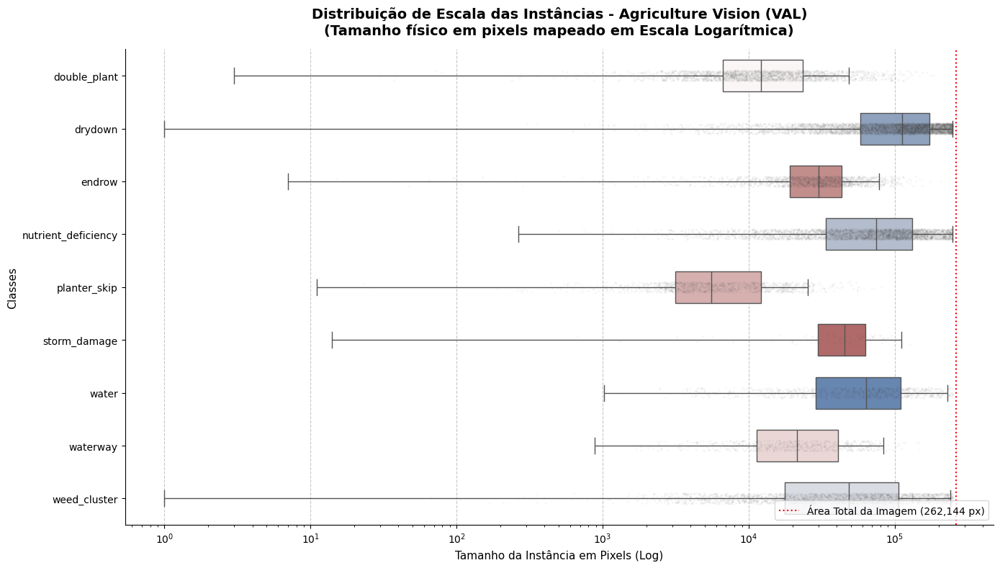

In [13]:
titulo_val = val_paths_dict["base"].name.upper()

plotFrequenciaClasses(imgs_val, total_arquivos_val, titulo_val)
plotAreaPixelsLog(pixs_val, titulo_val)
plotMatrizCoocorrencia(matriz_val, classes_val, titulo_val)
plotCoocorrenciaNormalizada(matriz_val, imgs_val, classes_val, titulo_val)
plotDistribuicaoEscala(df_escala_val, titulo_val)